# Hierarchical Exponential Smoothing Model

## Prepare Notebook

In [43]:
from collections.abc import Callable
from datetime import UTC, datetime

import arviz as az
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpyro
import numpyro.distributions as dist
import polars as pl
import seaborn as sns
from jax import random
from jaxlib.xla_extension import ArrayImpl
from numpyro.contrib.control_flow import scan
from numpyro.infer import MCMC, NUTS, SVI, Predictive, Trace_ELBO
from numpyro.infer.autoguide import AutoNormal
from pydantic import BaseModel, Field
from statsforecast import StatsForecast
from statsforecast.models import AutoETS

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.facecolor"] = "white"

numpyro.set_host_device_count(n=4)

rng_key = random.PRNGKey(seed=42)

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Read in Data

In [2]:
data_path = "https://raw.githubusercontent.com/felipeangelimvieira/prophetverse/main/docs/examples/tourism.csv"

raw_data_df = pl.read_csv(data_path, try_parse_dates=True)

data_df = raw_data_df.select(pl.all().name.to_lowercase())

data_df.head()

,quarter,region,state,purpose,trips
i64,date,str,str,str,f64
1,1998-01-01,"""Adelaide""","""South Australia""","""Business""",135.07769
2,1998-04-01,"""Adelaide""","""South Australia""","""Business""",109.987316
3,1998-07-01,"""Adelaide""","""South Australia""","""Business""",166.034687
4,1998-10-01,"""Adelaide""","""South Australia""","""Business""",127.160464
5,1999-01-01,"""Adelaide""","""South Australia""","""Business""",137.448533


## Exploratory Data Analysis

In [3]:
data_df.group_by("state").agg(pl.col("region").n_unique().alias("n_regions"))

state,n_regions
str,u32
"""New South Wales""",13
"""Western Australia""",5
"""South Australia""",12
"""Queensland""",12
"""ACT""",1
"""Northern Territory""",13
"""Victoria""",21


In [4]:
assert (
    data_df["region"].n_unique()
    == data_df.group_by("state")
    .agg(pl.col("region").n_unique().alias("n_regions"))["n_regions"]
    .sum()
)

In [5]:
data_df["purpose"].unique()

purpose
str
"""Other"""
"""Business"""
"""Visiting"""
"""Holiday"""


In [6]:
assert (
    data_df["purpose"].unique().shape[0]
    == data_df.group_by("region")
    .agg(pl.col("purpose").n_unique().alias("n_purposes"))["n_purposes"]
    .unique()
    .item()
)

In [7]:
data_df = data_df.with_columns(
    unique_id=pl.concat_str(
        [pl.col("state"), pl.col("region"), pl.col("purpose")], separator="::"
    )
)

data_df["unique_id"].n_unique()

308

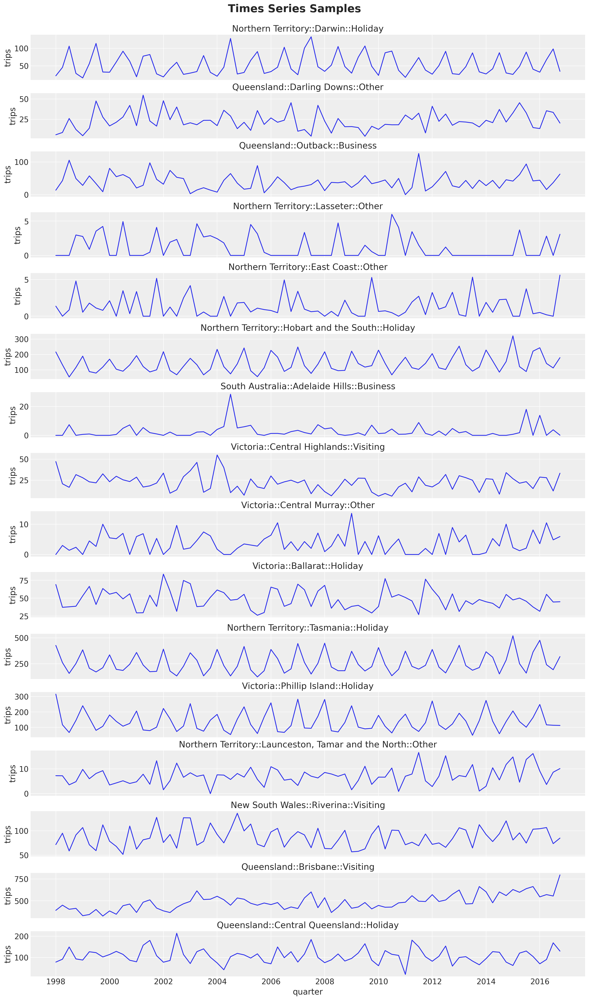

In [8]:
n_series = 16

unique_ids = data_df.select("unique_id").sample(
    n=n_series, with_replacement=False, seed=42
)

fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 25),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"]):
    ax = axes[i]
    sns.lineplot(
        data=data_df.filter(pl.col("unique_id") == unique_id),
        x="quarter",
        y="trips",
        ax=ax,
    )
    ax.set(title=unique_id)

fig.suptitle("Times Series Samples", fontsize=20, fontweight="bold", y=1.02);

## Prepare Data

In [35]:
train_test_split_date = datetime(year=2015, month=1, day=1, tzinfo=UTC)

train_data_df = data_df.filter(pl.col("quarter") < pl.lit(train_test_split_date))
test_data_df = data_df.filter(pl.col("quarter") >= pl.lit(train_test_split_date))

n_test = test_data_df["quarter"].n_unique().shape[0]

assert train_data_df.shape[0] + test_data_df.shape[0] == data_df.shape[0]

In [38]:
pivot_data_train_df = train_data_df.pivot(  # noqa: PD010
    index="quarter", columns="unique_id", values="trips"
)
pivot_data_test_df = test_data_df.pivot(  # noqa: PD010
    index="quarter", columns="unique_id", values="trips"
)

In [39]:
y_train = pivot_data_train_df.drop("quarter").to_jax()
y_test = pivot_data_test_df.drop("quarter").to_jax()

In [40]:
train_unique_ids = pivot_data_train_df.drop("quarter").columns
test_unique_ids = pivot_data_test_df.drop("quarter").columns

train_dates = pivot_data_train_df["quarter"].dt.strftime("%Y-%m-%d").to_numpy()
test_dates = pivot_data_test_df["quarter"].dt.strftime("%Y-%m-%d").to_numpy()

## Statsforecast Model

In [64]:
sf = StatsForecast(models=[AutoETS(season_length=4)], freq="QS")
sf_forecast = sf.forecast(
    h=n_test,
    df=train_data_df.select(["unique_id", "quarter", "trips"]).to_pandas(),
    time_col="quarter",
    target_col="trips",
)

/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.12/site-packages/statsforecast/core.py:485: FutureWarning: In a future version the predictions will have the id as a column. You can set the `NIXTLA_ID_AS_COL` environment variable to adopt the new behavior and to suppress this warning.
  warnings.warn(


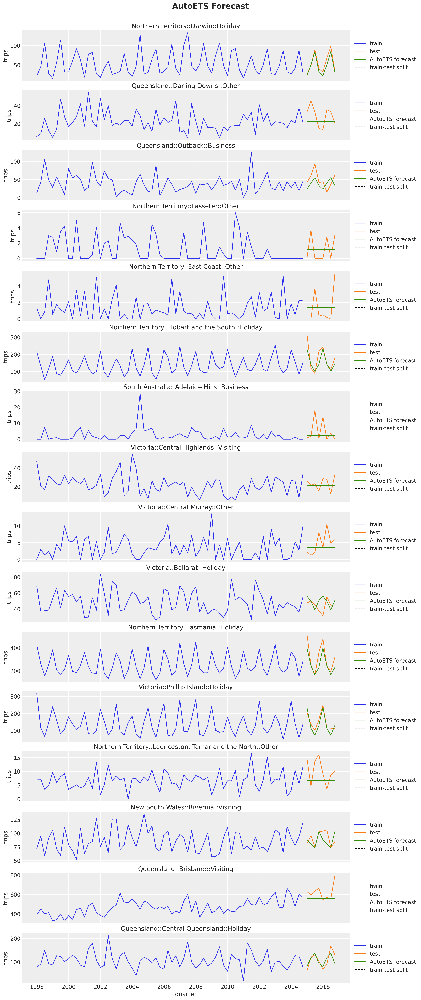

In [71]:
fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 35),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"]):
    ax = axes[i]
    sns.lineplot(
        x=pivot_data_train_df["quarter"],
        y=pivot_data_train_df[unique_id],
        color="C0",
        label="train",
        ax=ax,
    )
    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=pivot_data_test_df[unique_id],
        color="C1",
        label="test",
        ax=ax,
    )
    sns.lineplot(
        data=sf_forecast.reset_index(drop=False).query("unique_id == @unique_id"),
        x="quarter",
        y="AutoETS",
        color="C2",
        label="AutoETS forecast",
        ax=ax,
    )
    ax.axvline(
        train_test_split_date,
        color="black",
        linestyle="--",
        label="train-test split",
    )

    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax.set(title=unique_id, ylabel="trips")

fig.suptitle("AutoETS Forecast", fontsize=20, fontweight="bold", y=1.02);

## NumPyro Model

In [13]:
def model(y: ArrayImpl, n_seasons: int, future: int = 0) -> None:
    t_max, n_series = y.shape

    trend_smoothing_concentration1 = numpyro.sample(
        "trend_smoothing_concentration1",
        dist.Gamma(concentration=2.0, rate=1),
    )

    trend_smoothing_concentration0 = numpyro.sample(
        "trend_smoothing_concentration0",
        dist.Gamma(concentration=1.0, rate=1),
    )

    seasonality_smoothing_concentration1 = numpyro.sample(
        "seasonality_smoothing_concentration1",
        dist.Gamma(concentration=2.0, rate=1),
    )

    seasonality_smoothing_concentration0 = numpyro.sample(
        "seasonality_smoothing_concentration0",
        dist.Gamma(concentration=1.0, rate=1),
    )

    with numpyro.plate("series", n_series, dim=-1):
        # Level
        level_smoothing = numpyro.sample(
            "level_smoothing", dist.Beta(concentration1=1, concentration0=1)
        )

        level_init = numpyro.sample("level_init", dist.Normal(loc=0, scale=1))

        # Trend
        trend_smoothing = numpyro.sample(
            "trend_smoothing",
            dist.Beta(
                concentration1=trend_smoothing_concentration1,
                concentration0=trend_smoothing_concentration0,
            ),
        )

        trend_init = numpyro.sample("trend_init", dist.Normal(loc=0, scale=1))

        # Seasonality
        seasonality_smoothing = numpyro.sample(
            "seasonality_smoothing",
            dist.Beta(
                concentration1=seasonality_smoothing_concentration1,
                concentration0=seasonality_smoothing_concentration0,
            ),
        )
        adj_seasonality_smoothing = seasonality_smoothing * (1 - level_smoothing)

        with numpyro.plate("n_seasons", n_seasons, dim=-2):
            seasonality_init = numpyro.sample(
                "seasonality_init", dist.Normal(loc=0, scale=1)
            )

        ## Noise
        noise = numpyro.sample("noise", dist.HalfNormal(scale=1))

    def transition_fn(carry, t):
        previous_level, previous_trend, previous_seasonality = carry

        level = jnp.where(
            t < t_max,
            level_smoothing * y[t] + (1 - level_smoothing) * previous_level,
            previous_level,
        )

        trend = jnp.where(
            t < t_max,
            trend_smoothing * (level - previous_level)
            + (1 - trend_smoothing) * previous_trend,
            previous_trend,
        )

        new_season = jnp.where(
            t < t_max,
            adj_seasonality_smoothing * (y[t] - (previous_level + previous_trend))
            + (1 - adj_seasonality_smoothing) * previous_seasonality[0],
            previous_seasonality[0],
        )

        step = jnp.where(t < t_max, 1, t - t_max + 1)

        mu = previous_level + step * previous_trend + previous_seasonality[0]

        pred = numpyro.sample("pred", dist.Normal(loc=mu, scale=noise).to_event(1))

        seasonality = jnp.concatenate(
            [previous_seasonality[1:], new_season[None]], axis=0
        )

        return (level, trend, seasonality), pred

    with numpyro.handlers.condition(data={"pred": y}):
        _, preds = scan(
            transition_fn,
            (level_init, trend_init, seasonality_init),
            jnp.arange(t_max + future),
        )

    if future > 0:
        numpyro.deterministic("y_forecast", preds[-future:, ...])

## NUTS Inference

In [14]:
class InferenceParams(BaseModel):
    num_warmup: int = Field(1_000, ge=1)
    num_samples: int = Field(2_000, ge=1)
    num_chains: int = Field(4, ge=1)


def run_inference(
    rng_key: ArrayImpl,
    model: Callable,
    args: InferenceParams,
    *model_args,
    **nuts_kwargs,
) -> MCMC:
    sampler = NUTS(model, **nuts_kwargs)
    mcmc = MCMC(
        sampler=sampler,
        num_warmup=args.num_warmup,
        num_samples=args.num_samples,
        num_chains=args.num_chains,
    )
    mcmc.run(rng_key, *model_args)
    return mcmc

In [15]:
inference_params = InferenceParams()

n_seasons = 4

rng_key, rng_subkey = random.split(key=rng_key)
mcmc = run_inference(
    rng_subkey, model, inference_params, y_train, n_seasons, target_accept_prob=0.9
)

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

  0%|          | 0/3000 [00:00<?, ?it/s]

In [16]:
idata = az.from_numpyro(
    posterior=mcmc,
    coords={"unique_id": train_unique_ids},
    dims={
        "level_init": ["unique_id"],
        "level_smoothing": ["unique_id"],
        "trend_init": ["unique_id"],
        "trend_smoothing": ["unique_id"],
        "noise": ["unique_id"],
    },
)

print(f"""Divergences: {idata["sample_stats"]["diverging"].sum().item()}""")

Divergences: 0


In [17]:
def forecast(
    rng_key: ArrayImpl, model: Callable, samples: dict[str, ArrayImpl], *model_args
) -> dict[str, ArrayImpl]:
    predictive = Predictive(
        model=model,
        posterior_samples=samples,
        return_sites=["y_forecast"],
    )
    return predictive(rng_key, *model_args)

In [18]:
rng_key, rng_subkey = random.split(key=rng_key)
forecast = forecast(rng_subkey, model, mcmc.get_samples(), y_train, n_seasons, n_test)

In [19]:
idata.extend(
    az.from_numpyro(
        posterior_predictive=forecast,
        coords={"unique_id": train_unique_ids, "date": test_dates},
        dims={"y_forecast": ["date", "unique_id"]},
    )
)

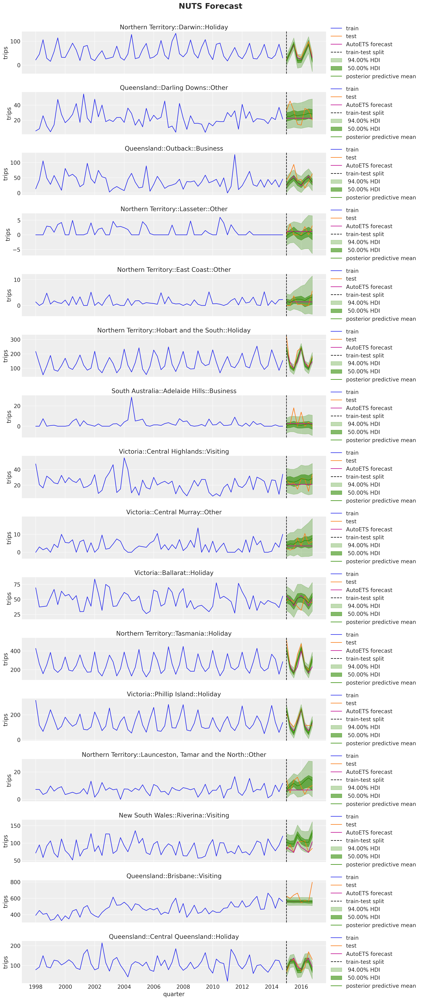

In [72]:
fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 35),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"]):
    ax = axes[i]
    sns.lineplot(
        x=pivot_data_train_df["quarter"],
        y=pivot_data_train_df[unique_id],
        color="C0",
        label="train",
        ax=ax,
    )
    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=pivot_data_test_df[unique_id],
        color="C1",
        label="test",
        ax=ax,
    )
    sns.lineplot(
        data=sf_forecast.reset_index(drop=False).query("unique_id == @unique_id"),
        x="quarter",
        y="AutoETS",
        color="C3",
        label="AutoETS forecast",
        ax=ax,
    )
    ax.axvline(
        train_test_split_date,
        color="black",
        linestyle="--",
        label="train-test split",
    )

    for j, hdi in enumerate([0.94, 0.5]):
        az.plot_hdi(
            x=pivot_data_test_df["quarter"],
            y=idata.posterior_predictive["y_forecast"].sel(unique_id=unique_id),
            hdi_prob=hdi,
            smooth=False,
            color="C2",
            fill_kwargs={"alpha": 0.3 * (j + 1), "label": f"{hdi: .2%} HDI"},
            ax=ax,
        )

    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=idata.posterior_predictive["y_forecast"]
        .sel(unique_id=unique_id)
        .mean(dim=("chain", "draw")),
        color="C2",
        label="posterior predictive mean",
        ax=ax,
    )

    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax.set(title=unique_id, ylabel="trips")

fig.suptitle("NUTS Forecast", fontsize=20, fontweight="bold", y=1.02);

## Stochastic Variational Inference (SVI)

100%|██████████| 10000/10000 [00:18<00:00, 530.14it/s, init loss: 74580432.0000, avg. loss [9501-10000]: 119093.6992]


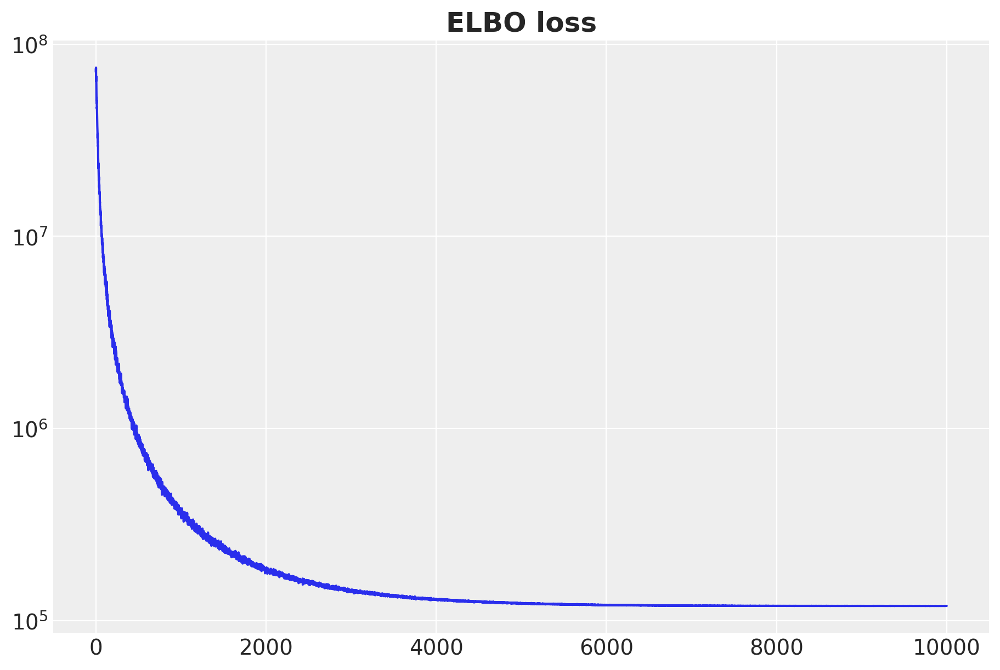

In [21]:
guide = AutoNormal(model=model)
optimizer = numpyro.optim.Adam(step_size=0.02)
svi = SVI(model, guide, optimizer, loss=Trace_ELBO())
n_samples = 10_000
rng_key, rng_subkey = random.split(key=rng_key)
svi_result = svi.run(
    rng_subkey,
    n_samples,
    y_train,
    n_seasons,
)

fig, ax = plt.subplots(figsize=(9, 6))
ax.plot(svi_result.losses)
ax.set(yscale="log")
ax.set_title("ELBO loss", fontsize=18, fontweight="bold");

In [22]:
rng_key, rng_subkey = random.split(rng_key)
svi_posterior_predictive = Predictive(
    model=model,
    guide=guide,
    params=svi_result.params,
    num_samples=inference_params.num_samples * inference_params.num_chains,
)(rng_subkey, y_train, n_seasons, n_test)

In [23]:
svi_idata = az.from_dict(
    posterior_predictive={
        k: jnp.expand_dims(a=jnp.asarray(v), axis=0)
        for k, v in svi_posterior_predictive.items()
    },
    coords={
        "unique_id": train_unique_ids,
        "date_test": test_dates,
        "date": [*train_dates, *test_dates],
    },
    dims={"y_forecast": ["date_test", "unique_id"], "pred": ["date", "unique_id"]},
)

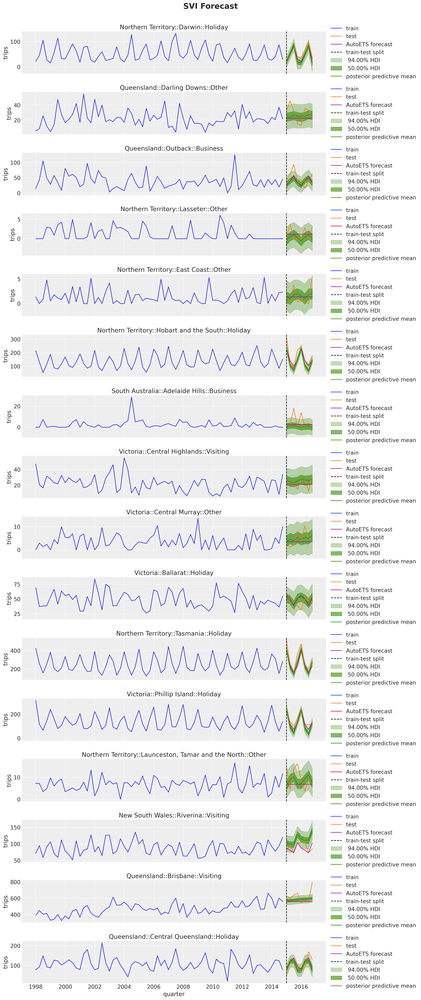

In [73]:
fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 35),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"]):
    ax = axes[i]
    sns.lineplot(
        x=pivot_data_train_df["quarter"],
        y=pivot_data_train_df[unique_id],
        color="C0",
        label="train",
        ax=ax,
    )
    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=pivot_data_test_df[unique_id],
        color="C1",
        label="test",
        ax=ax,
    )
    sns.lineplot(
        data=sf_forecast.reset_index(drop=False).query("unique_id == @unique_id"),
        x="quarter",
        y="AutoETS",
        color="C3",
        label="AutoETS forecast",
        ax=ax,
    )
    ax.axvline(
        train_test_split_date,
        color="black",
        linestyle="--",
        label="train-test split",
    )

    for j, hdi in enumerate([0.94, 0.5]):
        az.plot_hdi(
            x=pivot_data_test_df["quarter"],
            y=svi_idata.posterior_predictive["y_forecast"].sel(unique_id=unique_id),
            hdi_prob=hdi,
            smooth=False,
            color="C2",
            fill_kwargs={"alpha": 0.3 * (j + 1), "label": f"{hdi: .2%} HDI"},
            ax=ax,
        )

    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=svi_idata.posterior_predictive["y_forecast"]
        .sel(unique_id=unique_id)
        .mean(dim=("chain", "draw")),
        color="C2",
        label="posterior predictive mean",
        ax=ax,
    )

    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax.set(title=unique_id, ylabel="trips")

fig.suptitle("SVI Forecast", fontsize=20, fontweight="bold", y=1.02);